### Change the data path at line 244. To visualize from different models, change the configs yaml file at line 251, and trained checkpoint path on line 256 

Found 2975 train images
TEST BIG TEST


/home/rul002/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:252: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.


1 torch.Size([2, 3, 512, 1024])
2 torch.Size([2, 3, 512, 1024])
flipped: (2, 3, 512, 1024)
labelshape (512, 1024, 3)
predshape (512, 1024)


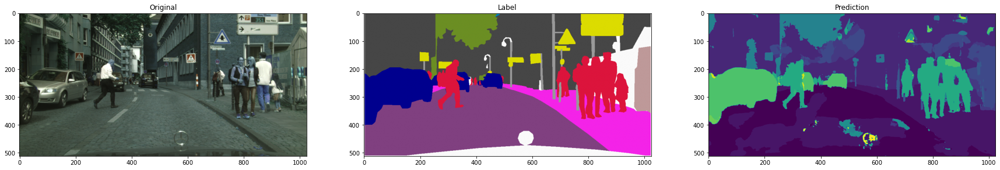

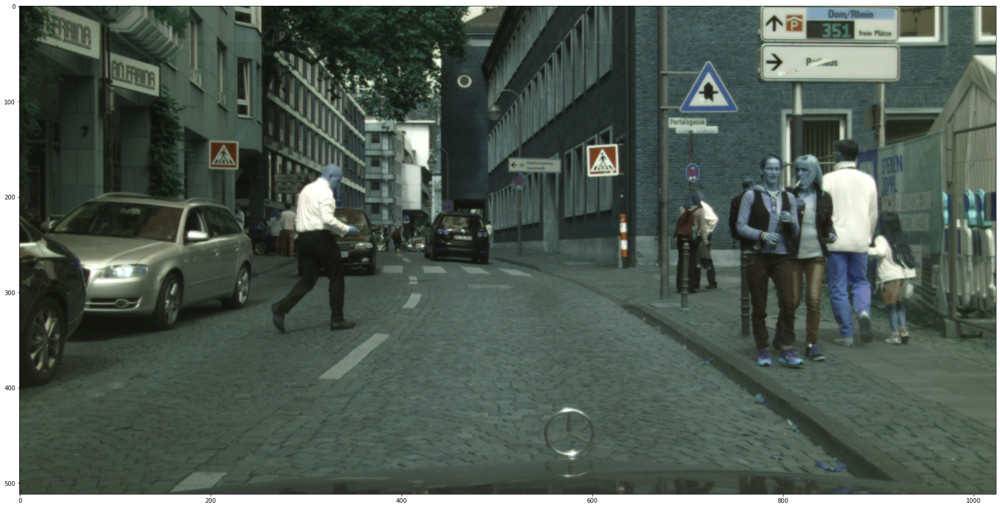

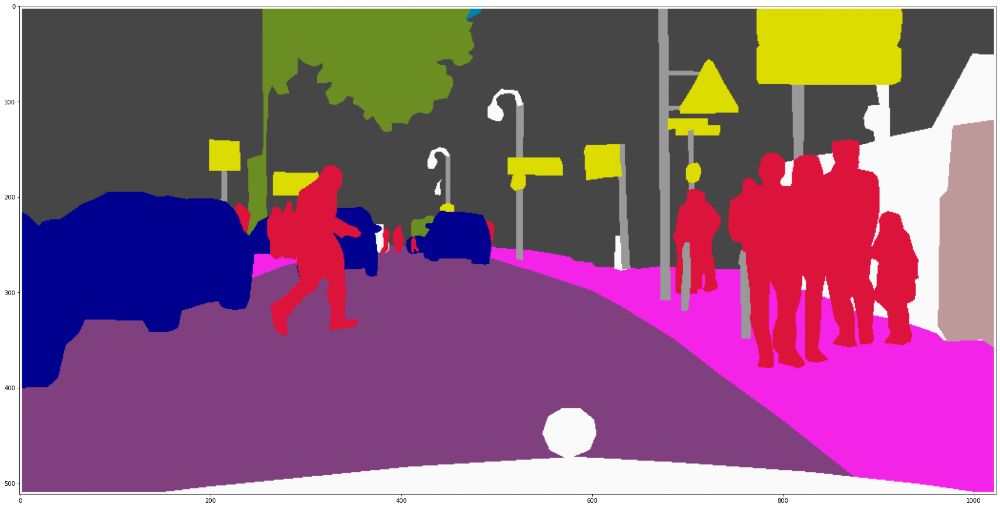

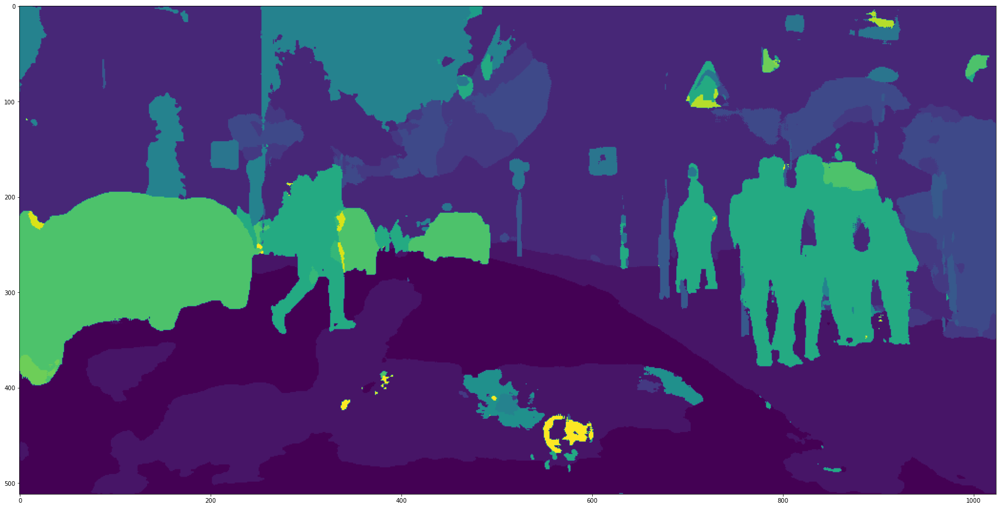

labelshape (512, 1024, 3)
predshape (512, 1024)


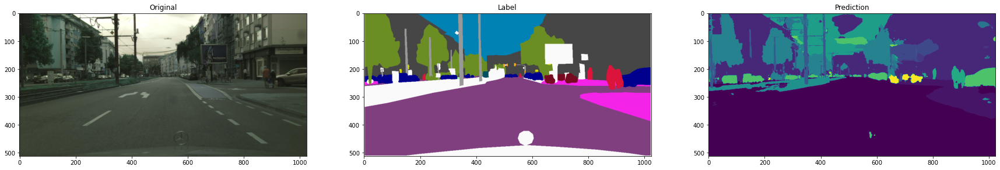

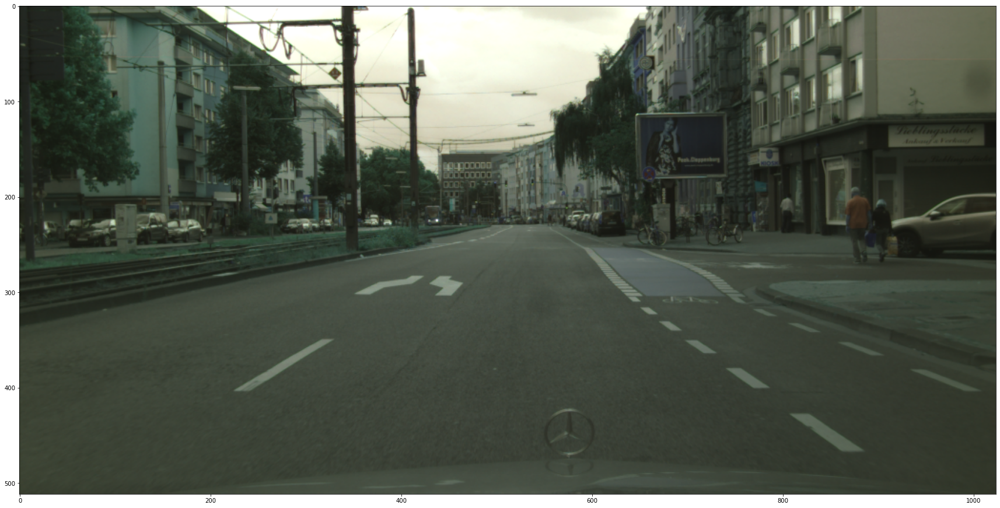

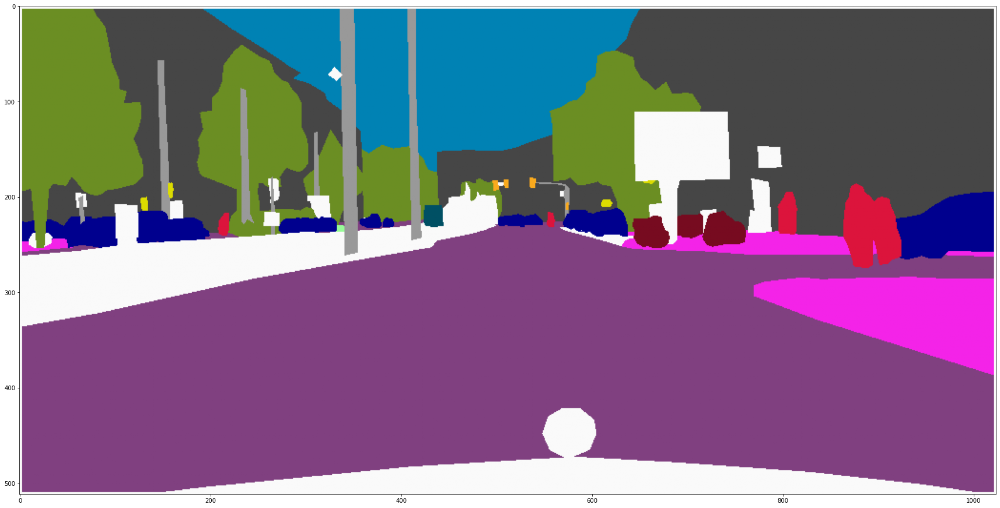

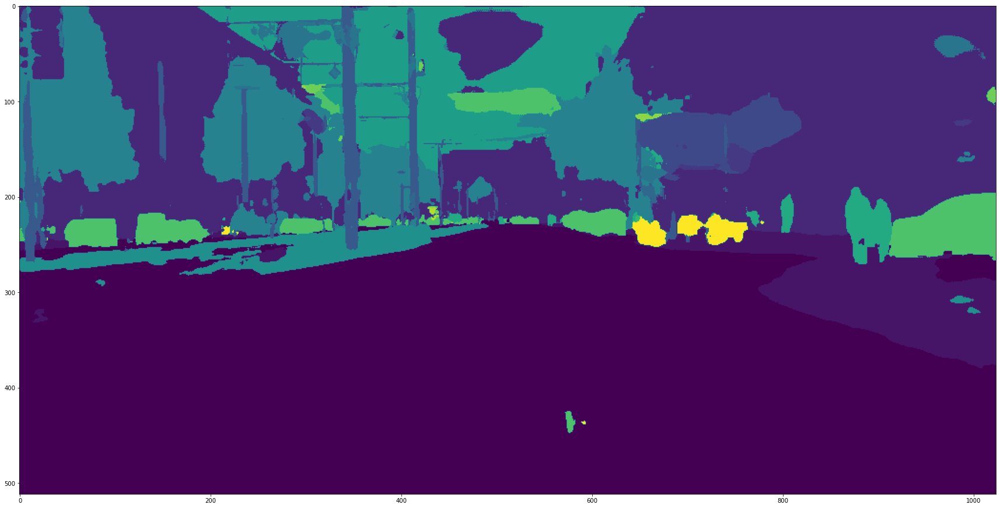

a
1 torch.Size([2, 3, 512, 1024])
2 torch.Size([2, 3, 512, 1024])
flipped: (2, 3, 512, 1024)
labelshape (512, 1024, 3)
predshape (512, 1024)


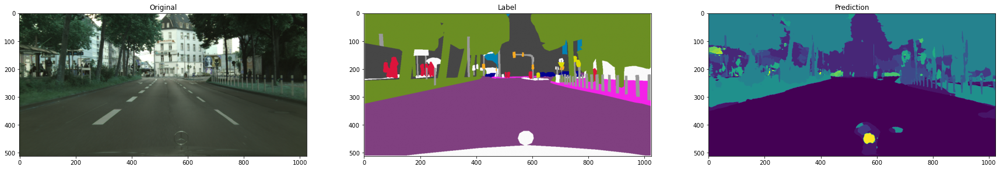

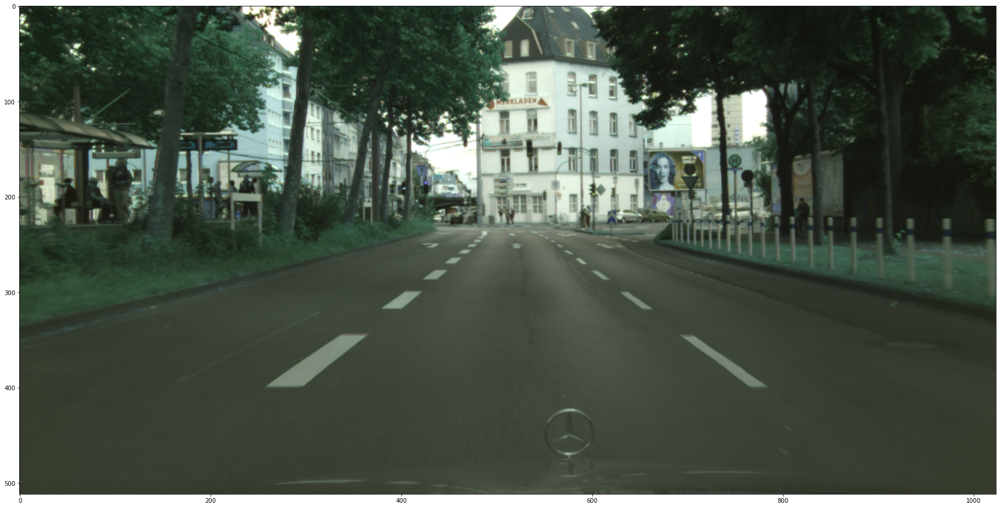

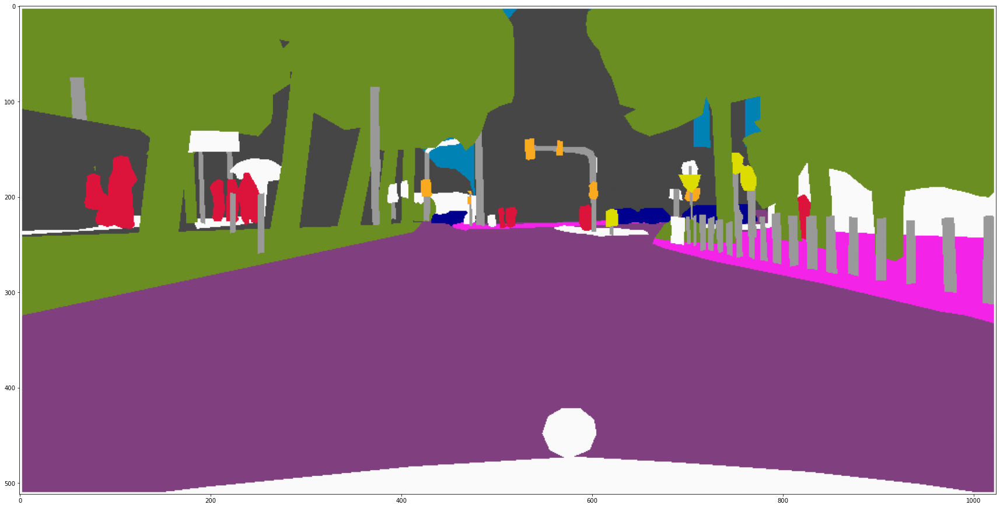

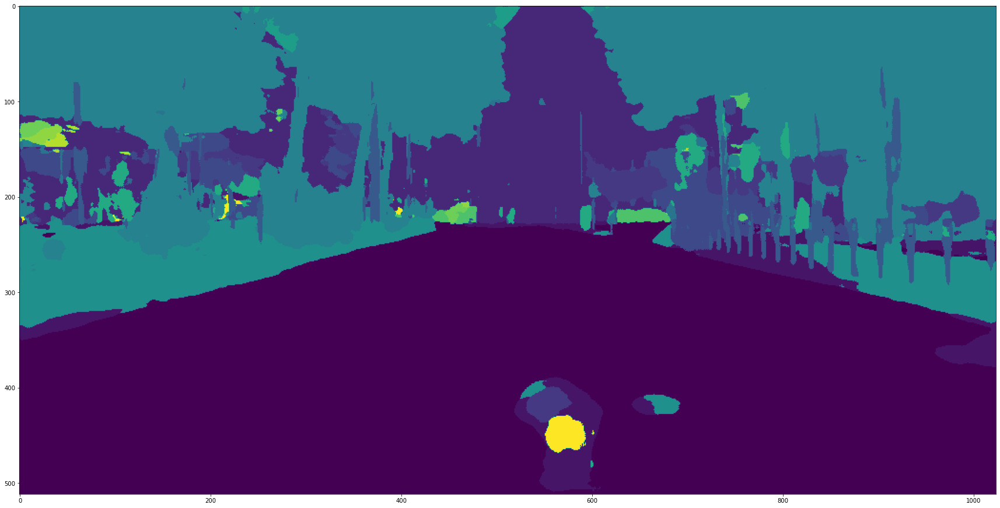

labelshape (512, 1024, 3)
predshape (512, 1024)


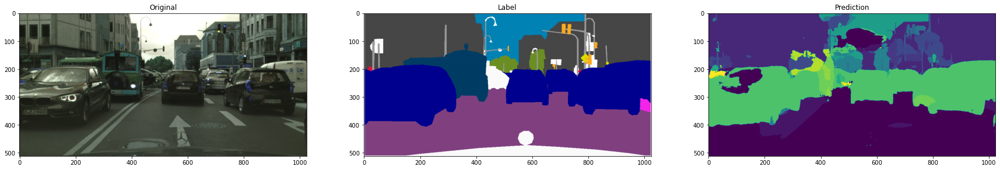

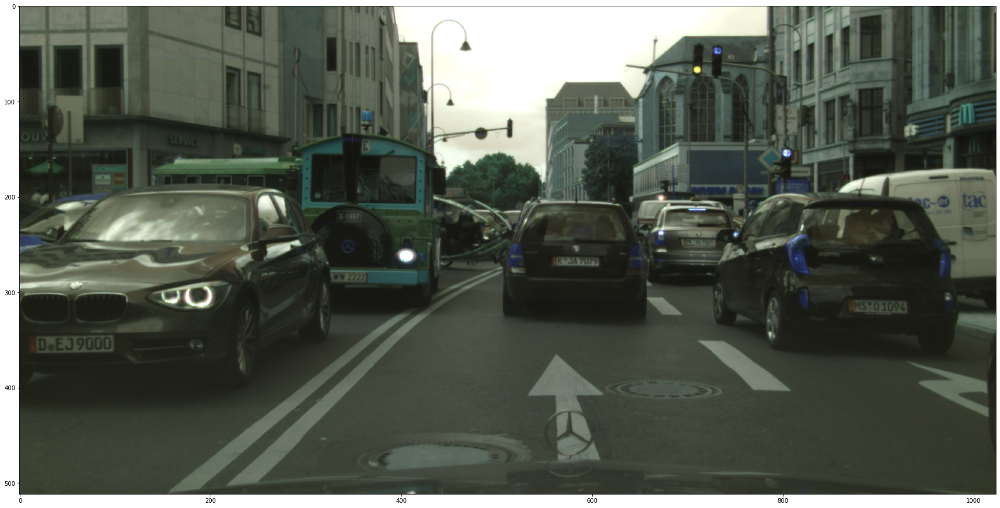

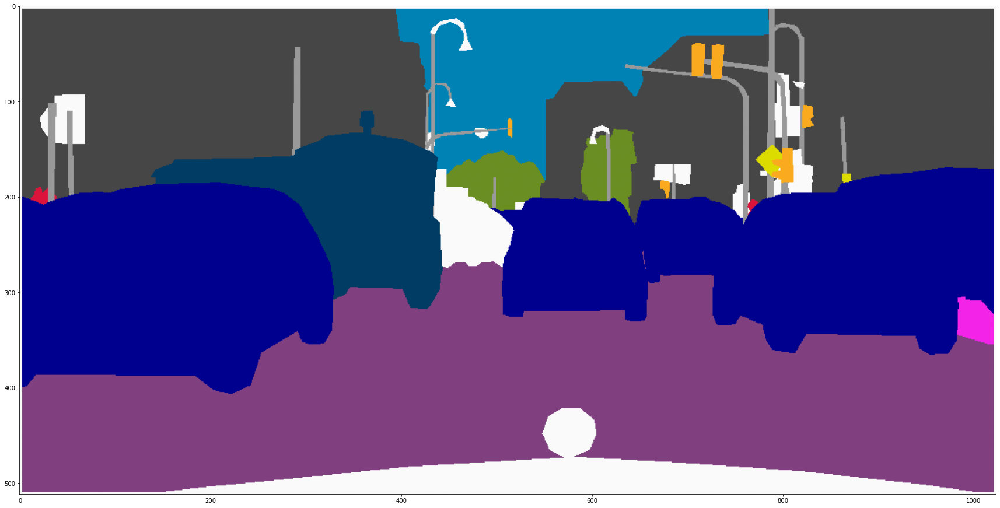

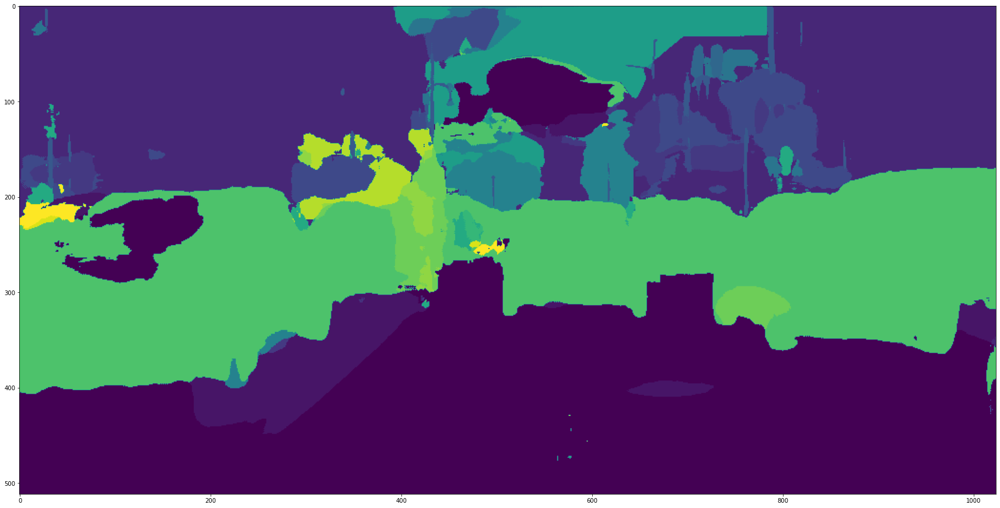

In [ ]:
import os
import torch
import numpy as np
import scipy.misc as m
import imageio
import cv2
import pickle
import yaml
import argparse
from ptsemseg.models import get_model
import timeit

from torch.utils import data

from ptsemseg.utils import recursive_glob
from ptsemseg.augmentations import Compose, RandomHorizontallyFlip, RandomRotate, Scale
from ptsemseg.utils import convert_state_dict

class cityscapesLoader(data.Dataset):
    """cityscapesLoader

    https://www.cityscapes-dataset.com

    Data is derived from CityScapes, and can be downloaded from here:
    https://www.cityscapes-dataset.com/downloads/

    Many Thanks to @fvisin for the loader repo:
    https://github.com/fvisin/dataset_loaders/blob/master/dataset_loaders/images/cityscapes.py
    """

    colors = [  # [  0,   0,   0],
        [128, 64, 128],
        [244, 35, 232],
        [70, 70, 70],
        [102, 102, 156],
        [190, 153, 153],
        [153, 153, 153],
        [250, 170, 30],
        [220, 220, 0],
        [107, 142, 35],
        [152, 251, 152],
        [0, 130, 180],
        [220, 20, 60],
        [255, 0, 0],
        [0, 0, 142],
        [0, 0, 70],
        [0, 60, 100],
        [0, 80, 100],
        [0, 0, 230],
        [119, 11, 32],
    ]

    label_colours = dict(zip(range(19), colors))

    mean_rgb = {
        "pascal": [103.939, 116.779, 123.68],
        "cityscapes": [0.0, 0.0, 0.0],
    }  # pascal mean for PSPNet and ICNet pre-trained model

    def __init__(
        self,
        root,
        split="train",
        is_transform=False,
        img_size=(512, 1024),
        augmentations=None,
        img_norm=True,
        version="cityscapes",
        test_mode=False,
    ):
        """__init__

        :param root:
        :param split:
        :param is_transform:
        :param img_size:
        :param augmentations
        """
        self.root = root
        self.split = split
        self.is_transform = is_transform
        self.augmentations = augmentations
        self.img_norm = img_norm
        self.n_classes = 19
        self.img_size = img_size if isinstance(img_size, tuple) else (img_size, img_size)
        self.mean = np.array(self.mean_rgb[version])
        self.files = {}

        self.images_base = os.path.join(self.root, "leftImg8bit", self.split)
        self.annotations_base = os.path.join(self.root, "gtFine", self.split)

        self.files[split] = recursive_glob(rootdir=self.images_base, suffix=".png")

        self.void_classes = [0, 1, 2, 3, 4, 5, 6, 9, 10, 14, 15, 16, 18, 29, 30, -1]
        self.valid_classes = [
            7,
            8,
            11,
            12,
            13,
            17,
            19,
            20,
            21,
            22,
            23,
            24,
            25,
            26,
            27,
            28,
            31,
            32,
            33,
        ]
        self.class_names = [
            "unlabelled",
            "road",
            "sidewalk",
            "building",
            "wall",
            "fence",
            "pole",
            "traffic_light",
            "traffic_sign",
            "vegetation",
            "terrain",
            "sky",
            "person",
            "rider",
            "car",
            "truck",
            "bus",
            "train",
            "motorcycle",
            "bicycle",
        ]

        self.ignore_index = 250
        self.class_map = dict(zip(self.valid_classes, range(19)))

        if not self.files[split]:
            raise Exception("No files for split=[%s] found in %s" % (split, self.images_base))

        print("Found %d %s images" % (len(self.files[split]), split))

    def __len__(self):
        """__len__"""
        return len(self.files[self.split])

    def __getitem__(self, index):
        """__getitem__

        :param index:
        """
        img_path = self.files[self.split][index].rstrip()
        lbl_path = os.path.join(
            self.annotations_base,
            img_path.split(os.sep)[-2],
            os.path.basename(img_path)[:-15] + "gtFine_labelIds.png",
        )

        img = imageio.imread(img_path)
        img = np.array(img, dtype=np.uint8)

        lbl = imageio.imread(lbl_path)
        lbl = self.encode_segmap(np.array(lbl, dtype=np.uint8))

        if self.augmentations is not None:
            img, lbl = self.augmentations(img, lbl)

        if self.is_transform:
            img, lbl = self.transform(img, lbl)

        return img, lbl

    def transform(self, img, lbl):
        """transform

        :param img:
        :param lbl:
        """
        #img = imageio.resize(img, (self.img_size[0], self.img_size[1]))  # uint8 with RGB mode
        img = cv2.resize(img, (self.img_size[1], self.img_size[0]), interpolation = cv2.INTER_AREA)
        img = img[:, :, ::-1]  # RGB -> BGR
        img = img.astype(np.float64)
        img -= self.mean
        if self.img_norm:
            # Resize scales images from 0 to 255, thus we need
            # to divide by 255.0
            img = img.astype(float) / 255.0
        # NHWC -> NCHW
        img = img.transpose(2, 0, 1)

        classes = np.unique(lbl)
        lbl = lbl.astype(float)
        #lbl = imageio.imresize(lbl, (self.img_size[0], self.img_size[1]), "nearest", mode="F")
        lbl = cv2.resize(lbl, (self.img_size[1], self.img_size[0]), interpolation = cv2.INTER_NEAREST)
        lbl = lbl.astype(int)

        if not np.all(classes == np.unique(lbl)):
            print("WARN: resizing labels yielded fewer classes")

        if not np.all(np.unique(lbl[lbl != self.ignore_index]) < self.n_classes):
            print("after det", classes, np.unique(lbl))
            raise ValueError("Segmentation map contained invalid class values")

        img = torch.from_numpy(img).float()
        lbl = torch.from_numpy(lbl).long()

        return img, lbl

    def decode_segmap(self, temp):
        r = temp.copy()
        g = temp.copy()
        b = temp.copy()
        for l in range(0, self.n_classes):
            r[temp == l] = self.label_colours[l][0]
            g[temp == l] = self.label_colours[l][1]
            b[temp == l] = self.label_colours[l][2]

        rgb = np.zeros((temp.shape[0], temp.shape[1], 3))
        rgb[:, :, 0] = r / 255.0
        rgb[:, :, 1] = g / 255.0
        rgb[:, :, 2] = b / 255.0
        return rgb

    def encode_segmap(self, mask):
        # Put all void classes to zero
        for _voidc in self.void_classes:
            mask[mask == _voidc] = self.ignore_index
        for _validc in self.valid_classes:
            mask[mask == _validc] = self.class_map[_validc]
        return mask


if __name__ == "__main__":
    import matplotlib.pyplot as plt

    augmentations = Compose([Scale(2048), RandomRotate(10), RandomHorizontallyFlip(0.5)])

#     local_path = "/datasets01/cityscapes/112817/"
    #local_path = "/datasets/cityscapes/"
    local_path = "/data/rul002/waveletCNN/cityscapes/"
    dst = cityscapesLoader(local_path, is_transform=True, test_mode=True)
    bs = 2
    testloader = data.DataLoader(dst, batch_size=bs, num_workers=0)
    
    #loaded_model = pickle.load(open("runs/fcn8s_cityscapes/2019125_21435/fcn8s_cityscapes_best_model.pkl", 'rb'))
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    f = open(r'configs/mwcnn_cityscapes.yml')
    cfg = yaml.load(f)
    #n_classes = trainloader.n_classes
    n_classes=19
    model = get_model(cfg["model"], n_classes).to(device)
    state = convert_state_dict(torch.load('runs/mwcnn_cityscapes/Modified/mwcnn_cityscapes_best_model.pkl')["model_state"])
    model.load_state_dict(state)
    model.eval()
    model.to(device)
    
    
    
    for i, (images, labels) in enumerate(testloader):
        print("1",images.shape)
        
        #start_time = timeit.default_timer()
        images = images.to(device)
        print("2",images.shape)
        outputs = model(images)
        
        # Flip images in numpy (not support in tensor)
        
        outputs = outputs.data.cpu().numpy()
        flipped_images = np.copy(images.data.cpu().numpy()[:, :, :, ::-1])
        print("flipped:", flipped_images.shape)
        flipped_images = torch.from_numpy(flipped_images).float().to(device)
        outputs_flipped = model(flipped_images)
        outputs_flipped = outputs_flipped.data.cpu().numpy()
        #outputs = (outputs + outputs_flipped[:, :, :, ::-1]) / 2.0
        pred = np.argmax(outputs, axis=1)
        
        #pred = outputs

        plt.rcParams['figure.figsize'] = [30, 30]
        images = images.data.cpu().numpy()
        images=np.transpose(images, [0, 2, 3, 1])
        #print(images.shape)
        for j in range (bs):
            f, axarr = plt.subplots(1, 3)
            axarr[0].set_title("Original")
            axarr[0].imshow(images[j])
            #imageio.imwrite('original_%s.jpg'%j, images[j])
            label=dst.decode_segmap(labels.numpy()[j])
            #imageio.imwrite('label_%s.jpg'%j, label)
            axarr[1].set_title("Label")
            print("labelshape", label.shape)
            axarr[1].imshow(label)
            axarr[2].set_title("Prediction")
            axarr[2].imshow(pred[j])
            print("predshape", pred[j].shape)
            #imageio.imwrite('pred_%s.jpg'%j, pred[j])
            plt.show()
            plt.imshow(images[j])
            plt.show()
            plt.imshow(label)
            plt.show()
            plt.imshow(pred[j])
            plt.show()
        a = input()
        if a == "ex":
            break
        else:
            plt.close()
    